In [1]:
import torchgeo
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms, utils
import imageio.v2 as io
from PIL import Image
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch
import albumentations as alb
from albumentations.pytorch import ToTensorV2

In [2]:
subdirs = ["baseball_field",
"basketball_court",
"beach",
"bridge",
"church",
"commercial_area",
"desert",
"golf_course",
"ground_track_field",
"road",
"intersection",
"island",
"lake",
"meadow",
"parking_lot",
"railway",
"train_station",
"river",
"roundabout",
"runway",
"stadium",
"storage_tank",
"tennis_court",
"airport_area",
"arable_land",
"residential_land",
"port_area",
"industrial_land"]


others = ['viaduct',
          'cemetery',
          'swimming_pool',
          'works',
          'watewater_plant',
          'substation',
          'solar_power_plant',
          'woodland',
          'rock_land',
          'bare_land',
          'sparse_shrub_land',
         ]

subdirs.extend(others)

In [3]:
import os
from PIL import Image
from torch.utils.data import Dataset

class RESISC45(Dataset):
    def __init__(self, root_dir, class_names, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        # create a list of all the image paths and their corresponding labels
        self.img_paths = []
        
        class_to_idx = {class_name: i for i, class_name in enumerate(class_names)}
            
        self.labels = []
        for label in class_names:
            label_dir = os.path.join(self.root_dir, label)
            if os.path.isdir(label_dir):
                for img_file in os.listdir(label_dir):
                    if img_file.endswith(".jpg"):
                        img_path = os.path.join(label_dir, img_file)
                        self.img_paths.append(img_path)
                        self.labels.append(class_to_idx[label])

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        # load the image from the given path
        img_path = self.img_paths[idx]
        img = Image.open(img_path).convert('RGB')
    
        # apply transforms if specified
        if self.transform:
            img = self.transform(img)
        
        # get the corresponding label
        label = self.labels[idx]

        return img, label
    
    def showitem(self, i):
        img_path = self.img_paths[i]
        img = io.imread(img_path)
        print(img.shape)
#         plt.figure()
        plt.imshow(img)


In [4]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset

class CustomAIDDataset(Dataset):
    def __init__(self, root_dir, class_names, transform):
        self.root_dir = root_dir
        self.class_names = class_names
        self.class_to_idx = {class_name: i for i, class_name in enumerate(class_names)}
        self.samples = self._make_dataset()
        self.transform=transform

    def __getitem__(self, index):
        path, target = self.samples[index]
        with open(path, 'rb') as f:
            img = Image.open(f)
            img = img.convert('RGB')
            
        if self.transform != None:
            img = self.transform(img)
            
        return img, target

    def __len__(self):
        return len(self.samples)

    def _make_dataset(self):
        samples = []
        for class_name in self.class_names:
            class_dir = None
            for dirpath, dirnames, filenames in os.walk(self.root_dir):
                if dirpath.endswith(class_name):
                    class_dir = dirpath
                    break
            if class_dir is None:
                continue
            for dirpath, dirnames, filenames in os.walk(class_dir):
                if not filenames:
                    continue
                for filename in filenames:
                    if filename.endswith('.jpg') or filename.endswith('.jpeg'):
                        path = os.path.join(dirpath, filename)
                        target = self.class_to_idx[class_name]
                        samples.append((path, target))
                        
        return samples


RESISC45 categories:
    - baseball_field
    - baseketball_court
    - beach
    - bridge (Note: please also put "overpass" in this folder.)
    - church
    - commercial_area
    - desert
    - golf_course
    - ground_track_field
    - freeway (Note: please put this into a folder called "road".)
    - intersection
    - island
    - lake
    - meadow
    - parking_lot
    - railway
    - railway_station (Note: please put this into a folder called "train_station".)
    - river
    - roundabout
    - runway
    - stadium
    - storage_tank
    - tennis_court
    - airport 
    - circular_farmland (Note: please put this into a folder called "arable_land".)
    - rectangular_farmland (Note: please put this into the same folder called "arable_land".)
    - dense_residential (Note: please put this into a folder called "residential_land".)
    - medium_residential (Note: please put this into the same folder called "residential_land".)
    - mobile_home_park (Note: please put this into the same folder called "residential_land".)
    - sparse_residential (Note: please put this into the same folder called "residential_land".)
    - harbor (Note: please put this into a folder called "port_area".)
    - industrial_area (Note: please put this into a folder called "industrial_land".)
    
Direct combine:
    - baseball_field
    - baseketball_court
    - beach
    - bridge (bridge ) (overpass)
    - church
    - commercial_area
    - desert
    - golf_course
    - ground_track_field
    - road (freeway)
    - intersection
    - island
    - lake
    - meadow
    - parking_lot
    - railway
    - train_station (railway_station)
    - river
    - roundabout (roundabout)
    - runway (runway)
    - stadium
    - storage_tank
    - tennis_court
    
    
Aggregate combine:
    - airport_area (airport)
    - arable_land (circular_farmland) (rectangular farmland)
    - residential_land (dense_residential) (medium_residential) (mobile_home_park) (sparse_residential)
    - port_area (harbor)
    - industrial_land (industrial_area)
    - 
    

## Experimenting with Transforms

In [5]:
# Calculate the mean, std of the complete dataset
# import glob
# import cv2
# import numpy as np 
# import tqdm
# import random

# # calculating 3 channel mean and std for image dataset

# means = np.array([0, 0, 0], dtype=np.float32)
# stds = np.array([0, 0, 0], dtype=np.float32)
# total_images = 0
# randomly_sample = 5000
# for f in tqdm.tqdm(random.sample(glob.glob("/mnt/e/julia/datasets/Million-AID1/train/train/**/**/*.jpg", recursive = True), randomly_sample)):
#     img = cv2.imread(f)
#     means += img.mean(axis=(0,1))
#     stds += img.std(axis=(0,1))
#     total_images += 1
# means = means / (total_images * 255.)
# stds = stds / (total_images * 255.)
# print("Total images: ", total_images)
# print("Means: ", means)
# print("Stds: ", stds)

In [6]:

# transform = alb.Compose([
#     alb.augmentations.transforms.Downscale(scale_min=0.05, scale_max=0.25, always_apply=True,)
# ])

# transform = alb.Compose([
#     alb.augmentations.geometric.resize.RandomScale (scale_limit=0.5, interpolation=1, always_apply=False, p=0.4),
#     alb.augmentations.transforms.Downscale(scale_min=0.05, scale_max=0.25, always_apply=False, p=0.4),
#     alb.augmentations.Blur(blur_limit=3, p=0.3),
#     alb.augmentations.geometric.transforms.PadIfNeeded(min_height=1000, min_width=1000, 
#                                                                  border_mode=cv2.BORDER_CONSTANT,
#                                                                    always_apply=False, p=0.2),
    
#     alb.augmentations.transforms.Normalize(mean=[0.345, 0.394, 0.383], std=[0.124, 0.130, 0.139], always_apply=True, p=1.0),
#     ToTensorV2()
#     ])

# t = torchvision.transforms.Compose([
# #             torchvision.transforms.RandomHorizontalFlip(p=0.5),
#             torchvision.transforms.Resize((224, 224)),
#             torchvision.transforms.ToTensor(),
#             torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#             ])

In [7]:
# create the transform
import torchvision.transforms.v2 as transforms
transform = transforms.Compose([
    transforms.RandomResize(min_size=int(256 // 25), max_size=int(256 // 1)),  # downsample the image by 150
    transforms.RandomHorizontalFlip(p = 0.5),
    transforms.Resize((256, 256)),  # resize the image back to its original size
])

/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit an

In [28]:
root_dir = '/mnt/e/julia/datasets/AID/train'
class_names = subdirs  # replace with your own class names
dataset = CustomAIDDataset(root_dir, class_names, transform=None)
# dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True)


TypeError: 'NoneType' object is not iterable

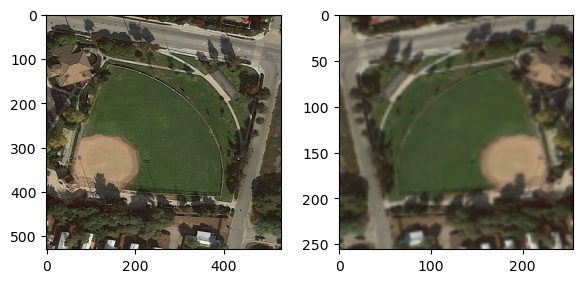

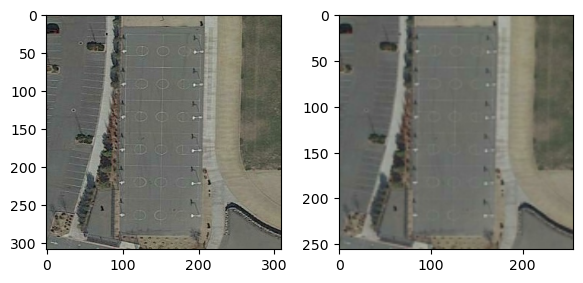

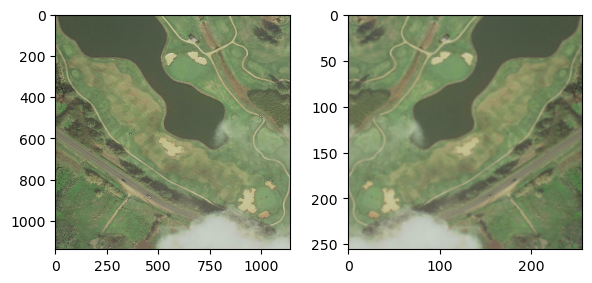

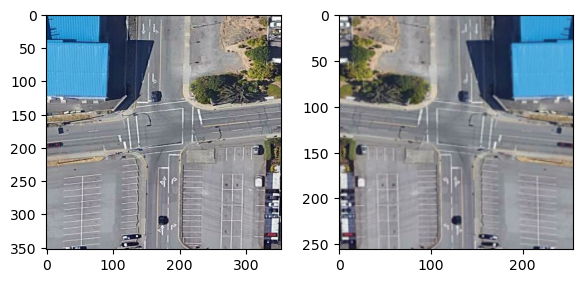

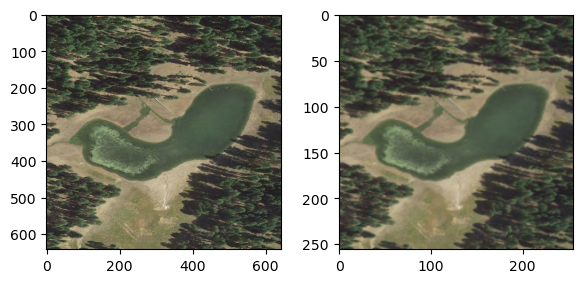

...

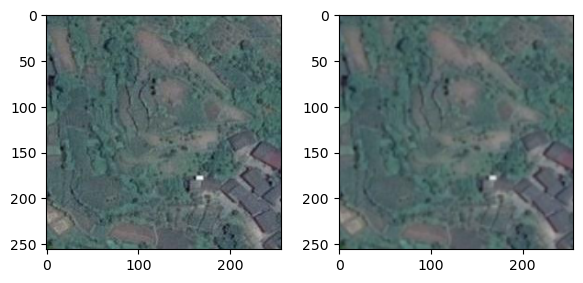

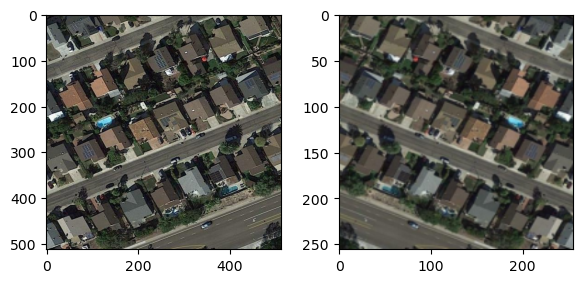

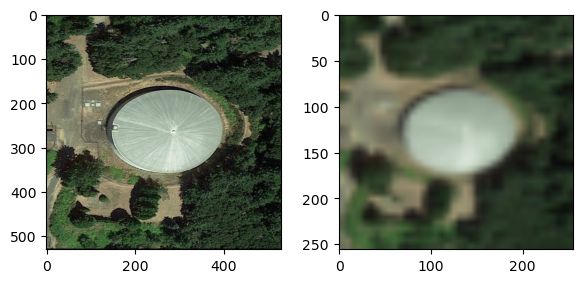

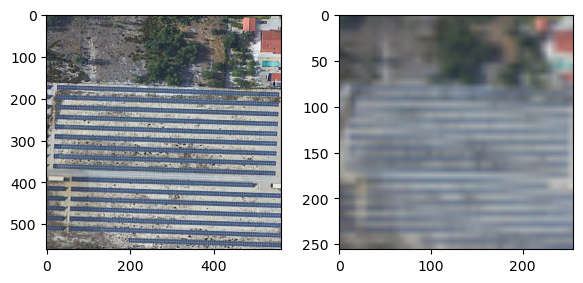

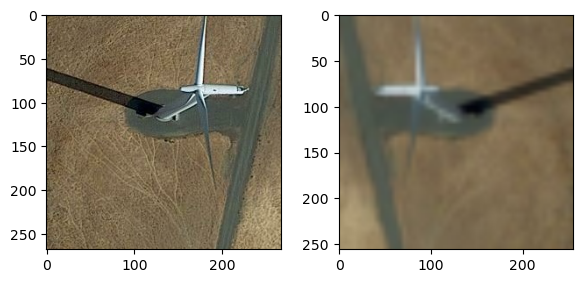

In [85]:
for i in [0, 500, 1200, 1800, 2200, 3200, 3800, 4200, 4800, 5200, 5800, 6500, 7500, 7800, 8500]:
    f, ax = plt.subplots(1, 2, figsize=(6, 3))
    plt.tight_layout()
    img = dataset.__getitem__(i)[0]
    ax[0].imshow(img)
    ax[1].imshow(transform(img))

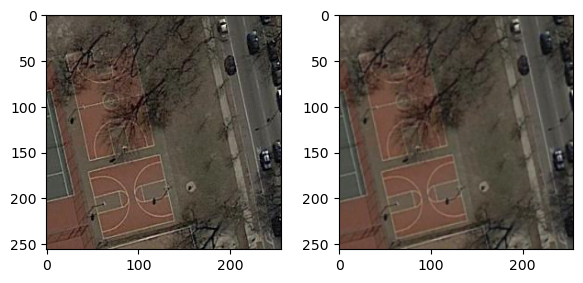

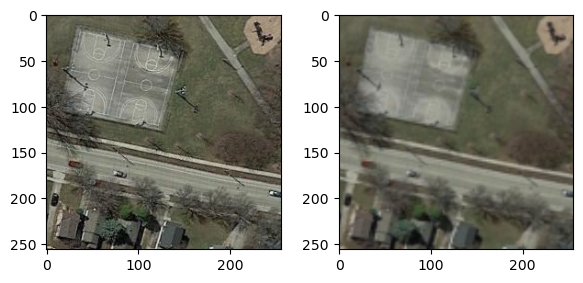

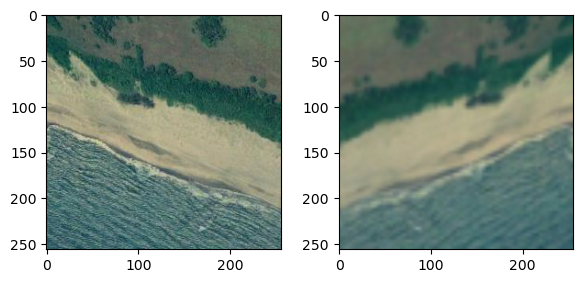

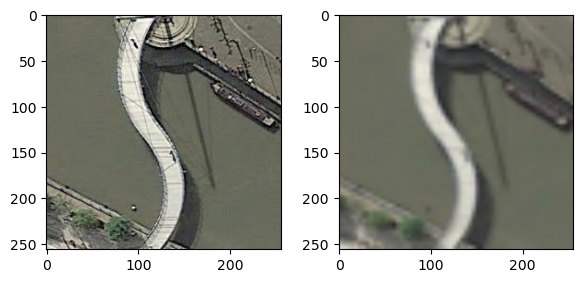

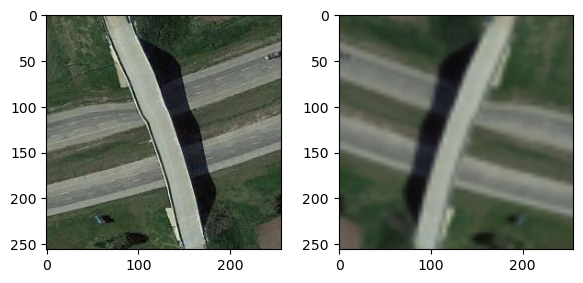

...

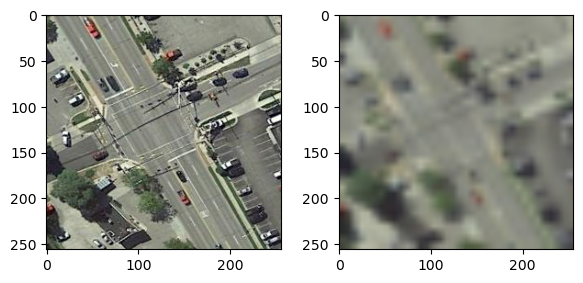

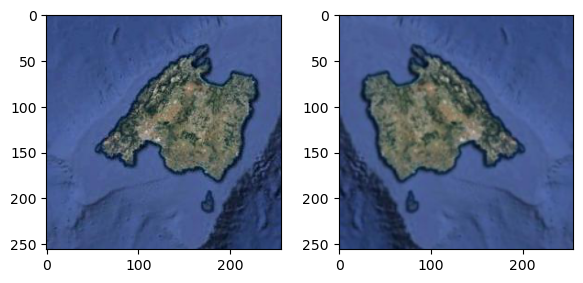

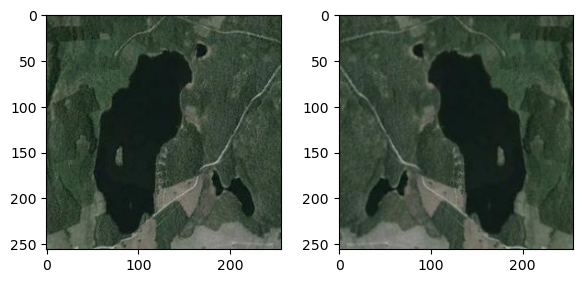

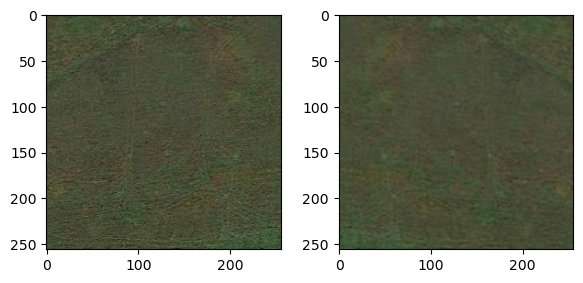

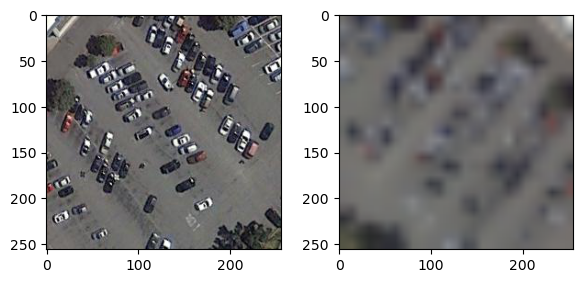

In [86]:
data = RESISC45('/mnt/e/julia/datasets/RESISC45/', transform=None)
for i in [0, 500, 1200, 1800, 2200, 3200, 3800, 4200, 4800, 5200, 5800, 6500, 7500, 7800, 8500, 9500, 9900]:
    f, ax = plt.subplots(1, 2, figsize=(6, 3))
    plt.tight_layout()
    img = data.__getitem__(i)[0]
    ax[0].imshow(img)
    ax[1].imshow(transform(img))

Error in callback <function _draw_all_if_interactive at 0x7fb12d5def80> (for post_execute):


KeyboardInterrupt: 

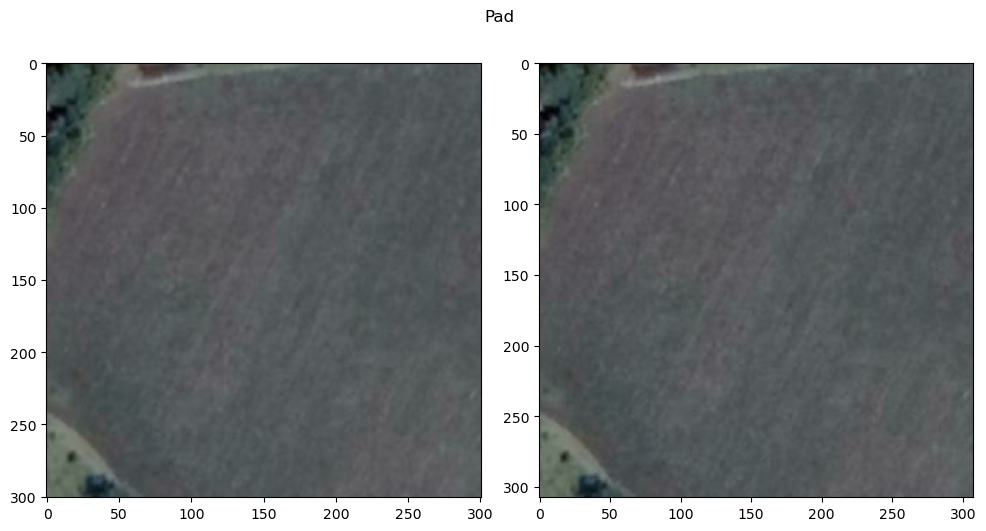

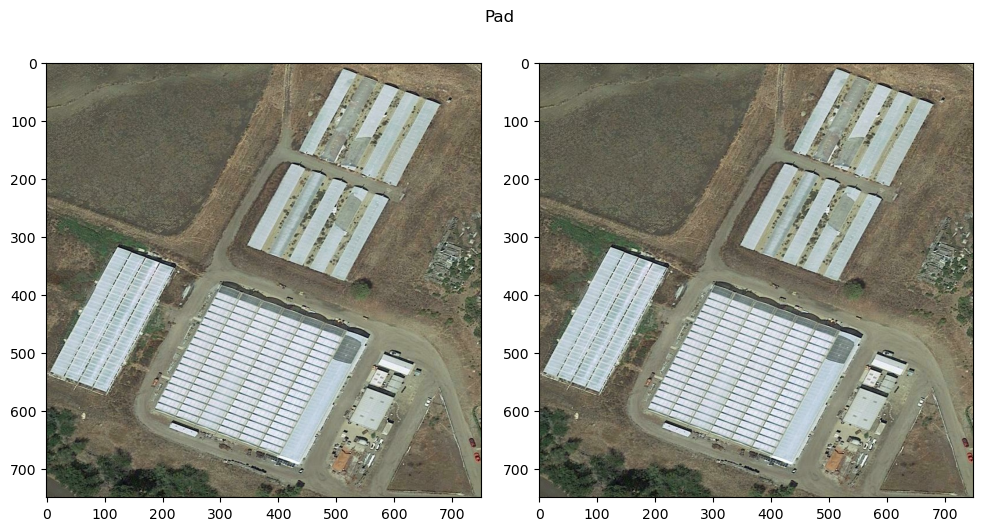

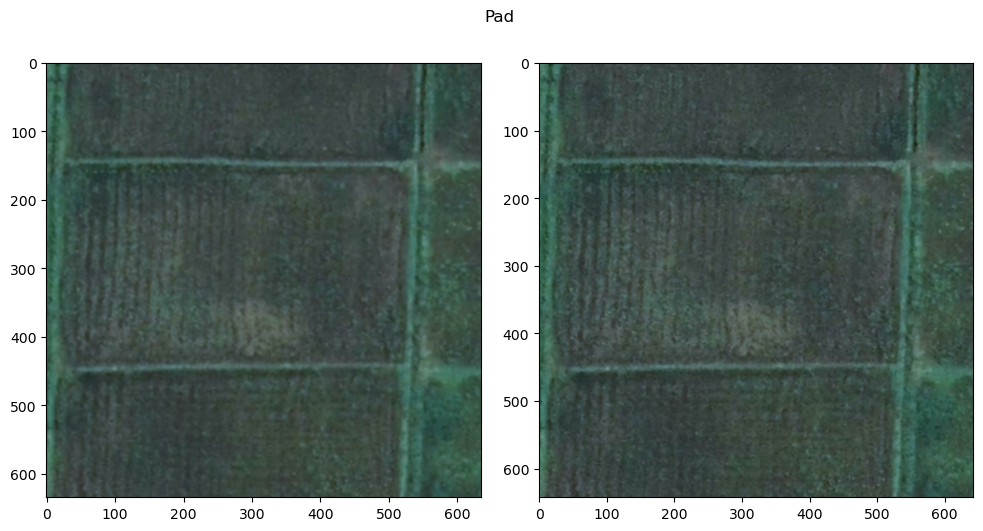

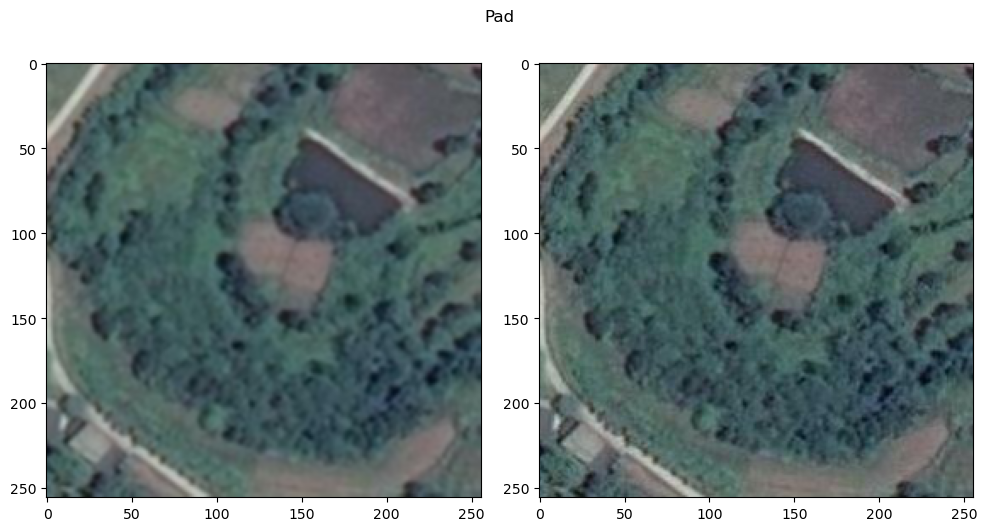

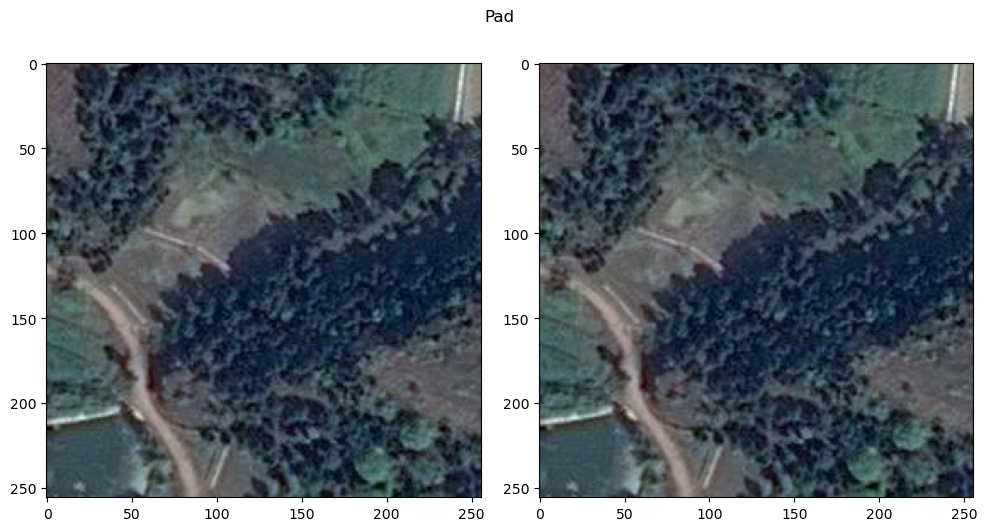

...

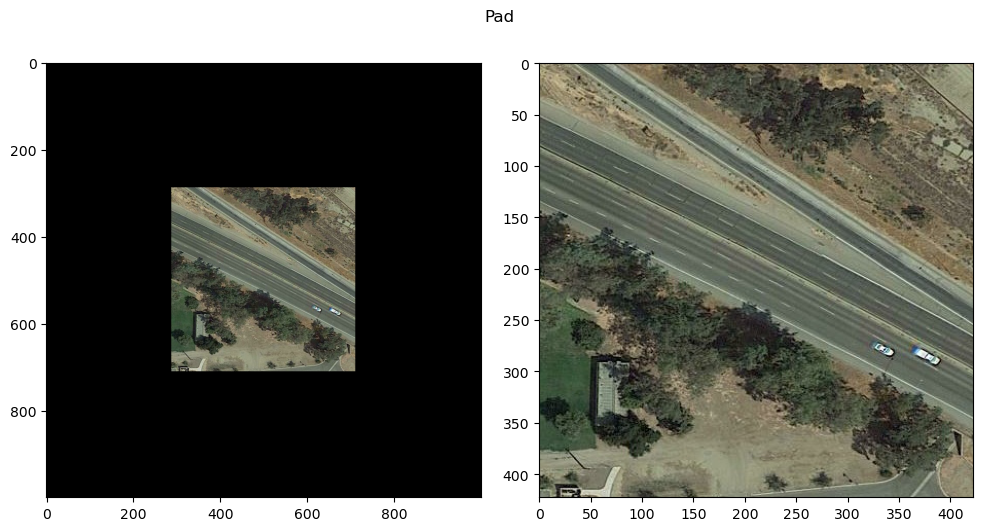

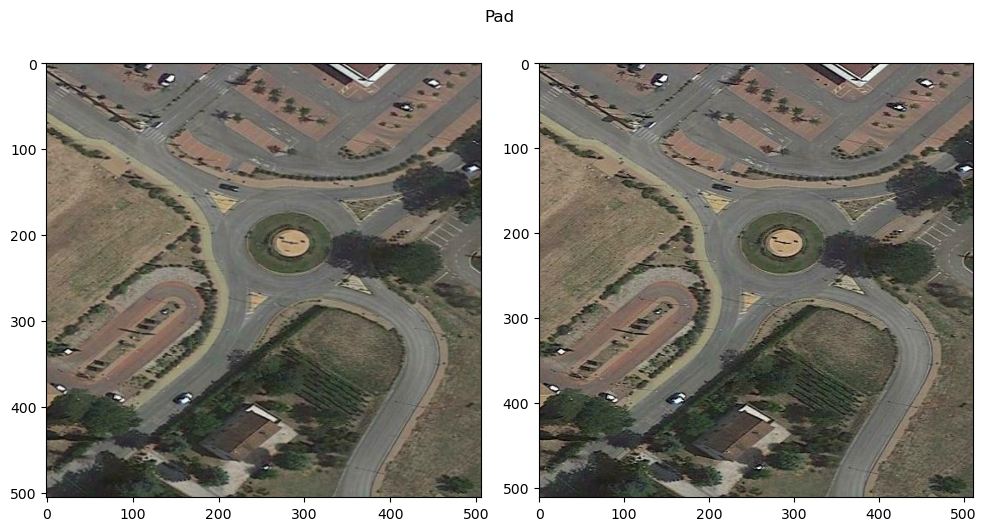

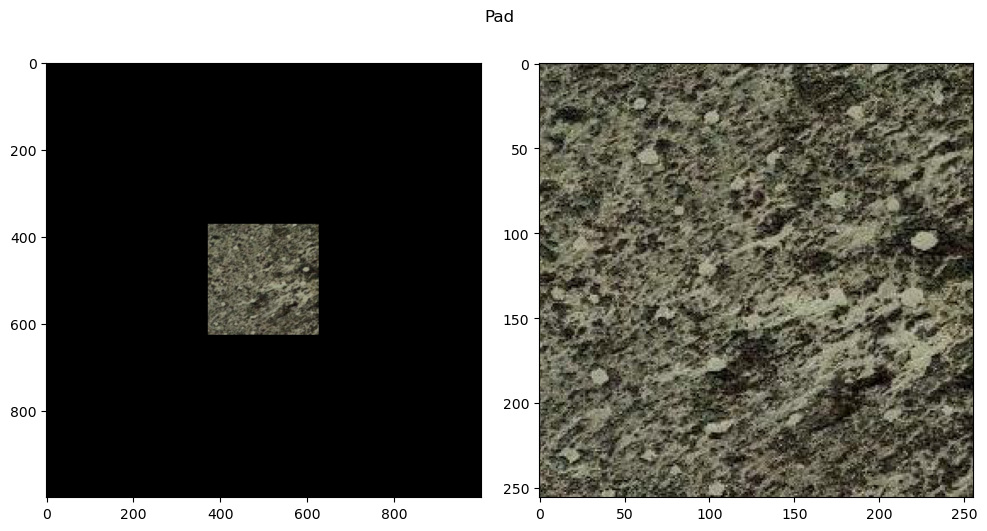

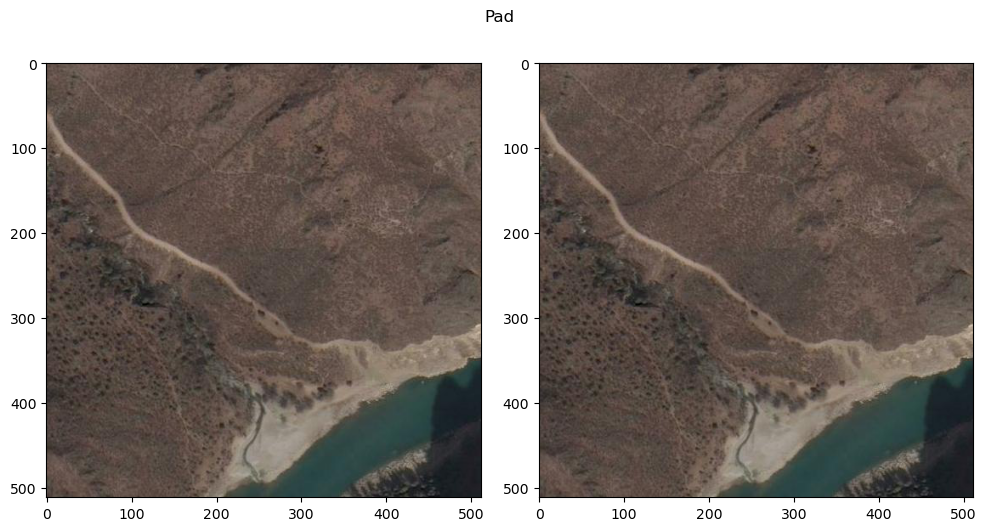

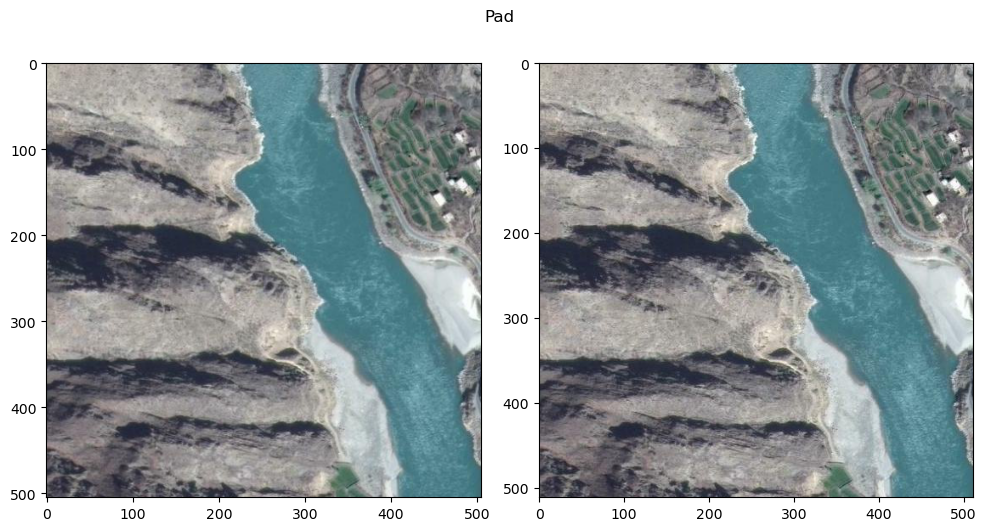

In [198]:
# for i in [0, 500, 1200, 1800, 2200, 3200, 3800, 4200, 4800, 5200, 5800, 6500, 7500, 7800, 8500, 9500, 9900]:
#     f, ax = plt.subplots(1, 2, figsize=(10, 8))
#     plt.tight_layout()
#     d.showitem(i)
#     ax[0].imshow(d.__getitem__(i)[0]['image'])
#     plt.suptitle('Pad', y=0.85)

# for i in [0, 500, 1200, 1800, 2200, 3200, 3800, 4200, 4800, 5200, 5800, 6500, 7500, 7800, 8500, 9500, 9900]:
#     f, ax = plt.subplots(1, 2, figsize=(10, 8))
#     plt.tight_layout()
#     d.showitem(i)
#     ax[0].imshow(d.__getitem__(i)[0]['image'])
#     plt.suptitle('Random Scale', y=0.85)

# for i in [0, 500, 1200, 1800, 2200, 3200, 3800, 4200, 4800, 5200, 5800, 6500, 7500, 7800, 8500, 9500, 9900]:
#     f, ax = plt.subplots(1, 2, figsize=(10, 8))
#     d.showitem(i)
#     ax[0].imshow(d.__getitem__(i)[0]['image'])
#     plt.suptitle('Downscale',y=0.85)

In [5]:
# img_path = '/mnt/e/julia/datasets/Million-AID1/test/P1000843.jpg'
# img = io.imread(img_path)
# plt.figure()
# plt.imshow(img)

In [7]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision.transforms.v2 as transforms
import numpy as np
import time
import os
import copy
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchgeo.datasets import MillionAID
from tqdm.notebook import tqdm

/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit an

In [8]:
from resnet_class import *

In [9]:
from torch.utils.data import Dataset, ConcatDataset

class CombinedDataset(Dataset):
    def __init__(self, dataset1, dataset2):
        self.dataset = ConcatDataset([dataset1, dataset2])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, index):
        return self.dataset[index]


In [11]:
subdirs

['baseball_field',
 'basketball_court',
 'beach',
 'bridge',
 'church',
 'commercial_area',
 'desert',
 'golf_course',
 'ground_track_field',
 'road',
 'intersection',
 'island',
 'lake',
 'meadow',
 'parking_lot',
 'railway',
 'train_station',
 'river',
 'roundabout',
 'runway',
 'stadium',
 'storage_tank',
 'tennis_court',
 'airport_area',
 'arable_land',
 'residential_land',
 'port_area',
 'industrial_land',
 'viaduct',
 'cemetery',
 'swimming_pool',
 'works',
 'watewater_plant',
 'substation',
 'solar_power_plant',
 'woodland',
 'rock_land',
 'bare_land',
 'sparse_shrub_land']

In [12]:
transform = transforms.Compose([
    transforms.RandomResize(min_size=int(256 // 25), max_size=int(256 // 1)),  # downsample the image by 150
    transforms.RandomHorizontalFlip(p = 0.5),
    transforms.Resize((256, 256)),  # resize the image back to its original size
    transforms.ToTensor()
])

root_dir = '/mnt/e/julia/datasets/AID/train'
class_names = subdirs  # replace with your own class names
dataset1 = CustomAIDDataset(root_dir, class_names, transform=transform)
dataset2 = RESISC45('/mnt/e/julia/datasets/RESISC45/', class_names, transform=transform)

combined_dataset = CombinedDataset(dataset1, dataset2)


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `transforms.Compose([transforms.ToImageTensor(), transforms.ConvertImageDtype()])`.
  warnings.warn(


In [13]:
combined_dataset

In [14]:
dataset1.__getitem__(500)

(tensor([[[0.3020, 0.3020, 0.3137,  ..., 0.3843, 0.3922, 0.4471],
          [0.3255, 0.3294, 0.3255,  ..., 0.5255, 0.5333, 0.5490],
          [0.3294, 0.3412, 0.3255,  ..., 0.4824, 0.4784, 0.4863],
          ...,
          [0.4353, 0.4353, 0.4392,  ..., 0.4118, 0.4039, 0.4039],
          [0.4353, 0.4353, 0.4353,  ..., 0.4157, 0.4157, 0.4235],
          [0.4275, 0.4275, 0.4275,  ..., 0.4431, 0.4275, 0.4039]],
 
         [[0.3176, 0.3137, 0.3216,  ..., 0.3765, 0.3843, 0.4314],
          [0.3412, 0.3412, 0.3333,  ..., 0.5255, 0.5216, 0.5333],
          [0.3451, 0.3529, 0.3333,  ..., 0.4824, 0.4745, 0.4824],
          ...,
          [0.4392, 0.4392, 0.4431,  ..., 0.4392, 0.4314, 0.4314],
          [0.4392, 0.4392, 0.4392,  ..., 0.4431, 0.4431, 0.4510],
          [0.4314, 0.4314, 0.4314,  ..., 0.4706, 0.4549, 0.4314]],
 
         [[0.2588, 0.2588, 0.2667,  ..., 0.3333, 0.3412, 0.3922],
          [0.2824, 0.2863, 0.2784,  ..., 0.4824, 0.4824, 0.4980],
          [0.2863, 0.2941, 0.2784,  ...,

In [15]:
combined_dataset.__len__()

32945

In [16]:
len(subdirs)

39

  0%|          | 0/45 [00:00<?, ?it/s]

Epoch 0/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.2399 Train Accuracy: 0.4774
Validation Loss: 3.2483 Validation Accuracy: 0.4599
Epoch 1/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.1644 Train Accuracy: 0.5486
Validation Loss: 3.1954 Validation Accuracy: 0.5206
Epoch 2/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.1532 Train Accuracy: 0.5588
Validation Loss: 3.1893 Validation Accuracy: 0.5261
Epoch 3/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.1346 Train Accuracy: 0.5784
Validation Loss: 3.2082 Validation Accuracy: 0.5064
Epoch 4/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.1227 Train Accuracy: 0.5896
Validation Loss: 3.1871 Validation Accuracy: 0.5291
Epoch 5/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.1015 Train Accuracy: 0.6131
Validation Loss: 3.1705 Validation Accuracy: 0.5443
Epoch 6/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.0738 Train Accuracy: 0.6402
Validation Loss: 3.2113 Validation Accuracy: 0.5046
Epoch 7/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.0349 Train Accuracy: 0.6771
Validation Loss: 3.0234 Validation Accuracy: 0.6885
Epoch 8/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.0096 Train Accuracy: 0.7012
Validation Loss: 3.0229 Validation Accuracy: 0.6885
Epoch 9/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 3.0003 Train Accuracy: 0.7098
Validation Loss: 3.0166 Validation Accuracy: 0.6955
Epoch 10/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9942 Train Accuracy: 0.7159
Validation Loss: 3.0115 Validation Accuracy: 0.6988
Epoch 11/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9876 Train Accuracy: 0.7217
Validation Loss: 3.0116 Validation Accuracy: 0.7061
Epoch 12/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9683 Train Accuracy: 0.7453
Validation Loss: 2.9882 Validation Accuracy: 0.7271
Epoch 13/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9576 Train Accuracy: 0.7562
Validation Loss: 2.9755 Validation Accuracy: 0.7368
Epoch 14/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9450 Train Accuracy: 0.7704
Validation Loss: 2.9639 Validation Accuracy: 0.7526
Epoch 15/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9361 Train Accuracy: 0.7797
Validation Loss: 2.9612 Validation Accuracy: 0.7505
Epoch 16/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9292 Train Accuracy: 0.7863
Validation Loss: 2.9603 Validation Accuracy: 0.7526
Epoch 17/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9251 Train Accuracy: 0.7903
Validation Loss: 2.9552 Validation Accuracy: 0.7593
Epoch 18/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9224 Train Accuracy: 0.7918
Validation Loss: 2.9531 Validation Accuracy: 0.7605
Epoch 19/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9211 Train Accuracy: 0.7927
Validation Loss: 2.9514 Validation Accuracy: 0.7614
Epoch 20/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9187 Train Accuracy: 0.7952
Validation Loss: 2.9473 Validation Accuracy: 0.7656
Epoch 21/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9168 Train Accuracy: 0.7969
Validation Loss: 2.9511 Validation Accuracy: 0.7620
Epoch 22/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9172 Train Accuracy: 0.7964
Validation Loss: 2.9533 Validation Accuracy: 0.7620
Epoch 23/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9192 Train Accuracy: 0.7938
Validation Loss: 2.9501 Validation Accuracy: 0.7638
Epoch 24/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9164 Train Accuracy: 0.7968
Validation Loss: 2.9495 Validation Accuracy: 0.7623
Epoch 25/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9163 Train Accuracy: 0.7978
Validation Loss: 2.9466 Validation Accuracy: 0.7684
Epoch 26/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9165 Train Accuracy: 0.7970
Validation Loss: 2.9459 Validation Accuracy: 0.7681
Epoch 27/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9161 Train Accuracy: 0.7976
Validation Loss: 2.9498 Validation Accuracy: 0.7641
Epoch 28/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9163 Train Accuracy: 0.7972
Validation Loss: 2.9448 Validation Accuracy: 0.7696
Epoch 29/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9159 Train Accuracy: 0.7974
Validation Loss: 2.9493 Validation Accuracy: 0.7659
Epoch 30/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9154 Train Accuracy: 0.7979
Validation Loss: 2.9491 Validation Accuracy: 0.7641
Epoch 31/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9155 Train Accuracy: 0.7983
Validation Loss: 2.9525 Validation Accuracy: 0.7614
Epoch 32/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9160 Train Accuracy: 0.7978
Validation Loss: 2.9457 Validation Accuracy: 0.7687
Epoch 33/44
----------


/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (110124036 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/home/julia/miniconda3/envs/myenv/lib/python3.10/site-packages/PIL/Image.py:3167: DecompressionBombWarning: Image size (93508900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Train Loss: 2.9161 Train Accuracy: 0.7976
Validation Loss: 2.9482 Validation Accuracy: 0.7650
No improvement in validation loss for 5 epochs. Early stopping.


ValueError: x and y must have same first dimension, but have shapes (45,) and (34,)

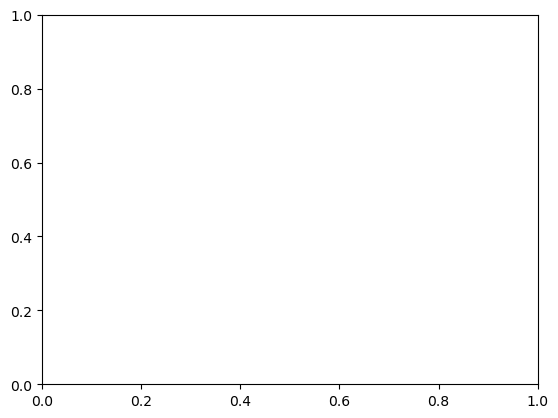

In [21]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# create the data loaders
train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(combined_dataset, [0.78, 0.10, 0.12])

train_loader = DataLoader(train_dataset, batch_size=500, shuffle=True, num_workers=7)
val_loader = DataLoader(val_dataset, batch_size=300, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=300, shuffle=False, num_workers=4)

     
model = RSResNet18(num_classes=len(subdirs)).to(device)

# define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=.0005)

# define the learning rate scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# define the device (GPU or CPU)
model = model.to(device)

# define the training function
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, patience=5):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    train_losses = []
    val_losses = []
    train_accs = []
    val_accs = []
    
     # initialize early stopping variables
    early_stop = False
    no_improvement_count = 0
    best_val_loss = np.inf

    for epoch in tqdm(range(num_epochs)):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # training phase
        model.train()
        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            

            optimizer.zero_grad()

            with torch.set_grad_enabled(True):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                loss.backward()
                optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        train_loss = running_loss / len(train_dataset)
        train_acc = running_corrects.double() / len(train_dataset)
        train_losses.append(train_loss)
        train_accs.append(train_acc)

        print('Train Loss: {:.4f} Train Accuracy: {:.4f}'.format(train_loss, train_acc))

        # validation phase
        model.eval()
        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            with torch.set_grad_enabled(False):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        val_loss = running_loss / len(val_dataset)
        val_acc = running_corrects.double() / len(val_dataset)
        val_losses.append(val_loss)
        val_accs.append(val_acc)

        print('Validation Loss: {:.4f} Validation Accuracy: {:.4f}'.format(val_loss, val_acc))
        
        # early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            no_improvement_count = 0
            best_model_wts = copy.deepcopy(model.state_dict())
            checkpoint = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }
            torch.save(checkpoint,os.path.join(f'best_so_far_epoch.tar'))
        else:
            no_improvement_count += 1
            if no_improvement_count == patience:
                print(f"No improvement in validation loss for {patience} epochs. Early stopping.")
                early_stop = True

        if early_stop:
            break
            
#         # deep copy the model
#         if val_acc > best_acc:
#             best_acc = val_acc
#             best_model_wts = copy.deepcopy(model.state_dict())
            
        scheduler.step()

    # load best model weights
    model.load_state_dict(best_model_wts)

#     # plot the training curve
#     torch.save(checkpoint,os.path.join('best_trained_model.tar'))
    
    plt.figure()
    plt.plot(range(num_epochs), train_losses, label='Train')
    plt.plot(range(num_epochs), val_losses, label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training Curve')
    plt.savefig('loss curve')
    plt.show()

#     plt.figure()
    train_accs = torch.tensor(train_accs, device = 'cpu')
    val_accs = torch.tensor(val_accs, device = 'cpu')
    plt.plot(range(num_epochs), train_accs, label='Train')
    plt.plot(range(num_epochs), val_accs, label='Validation')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Training Curve')
    plt.savefig('accuracy curve')
    plt.show()

    return model

# train the model
model = train_model(model, criterion, optimizer, scheduler, num_epochs=45)
checkpoint = {
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }
torch.save(checkpoint,os.path.join('best_trained_model.tar'))

In [22]:
def test(model,loss_fn, dataloader):
    model.eval()
    running_loss = 0
    running_corrects = 0
    for i, (test, labels) in enumerate(dataloader):
        test = test.to(device)
        labels = labels.to(device)
        
        outputs = model(test)
        loss = loss_fn(outputs, labels)
        
        _, preds = torch.max(outputs, 1)
        running_loss += loss.item() * test.size(0)
        running_corrects += torch.sum(preds == labels.data)
        
        
    test_loss = running_loss / len(test_dataset)
    test_acc = running_corrects.double() / len(test_dataset)
    
    print(f'Testing Loss: {test_loss}')
    print(f'Testing Accuracy: {test_acc}')

In [23]:
preds = model(test.to(device))

AttributeError: 'function' object has no attribute 'to'

In [ ]:
test_loader = DataLoader(test_dataset, batch_size=50, shuffle=False, num_workers=2)
test(model, criterion, test_loader)

In [14]:
model(test_dataset)

TypeError: conv2d() received an invalid combination of arguments - got (Subset, Parameter, NoneType, tuple, tuple, tuple, int), but expected one of:
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, tuple of ints padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!Subset!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
 * (Tensor input, Tensor weight, Tensor bias, tuple of ints stride, str padding, tuple of ints dilation, int groups)
      didn't match because some of the arguments have invalid types: (!Subset!, !Parameter!, !NoneType!, !tuple of (int, int)!, !tuple of (int, int)!, !tuple of (int, int)!, int)
